In [8]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
import time

def drawFlow(img,flow,step=16):
  h,w = img.shape[:2]

  idx_y,idx_x = np.mgrid[step//2:h:step, step//2:w:step].astype(np.int32)
  indices = np.stack((idx_x,idx_y), axis=-1).reshape(-1,2)
  arrow_color = (255,0,0)
  for x, y in indices :
    cv2.circle(img,(x,y),1,arrow_color,-1)
    dx,dy = flow[y,x].astype(np.int32)
    end_point = (x+dx,y+dy)
    cv2.arrowedLine(img,(x,y),end_point,arrow_color,1,cv2.LINE_AA,tipLength=0.3)


prev = None






--- Frame 0 Farneback ---


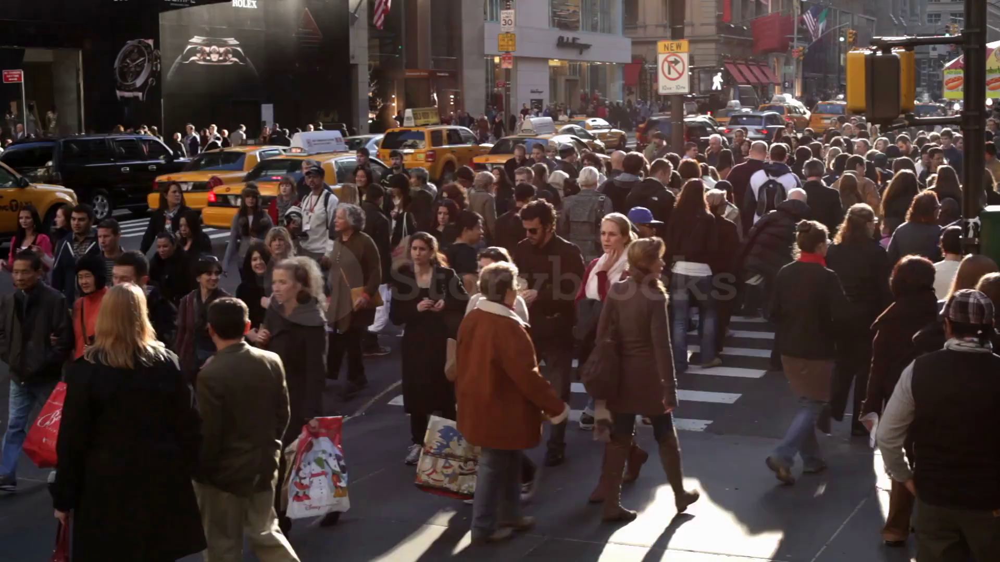


--- Frame 20 Farneback ---


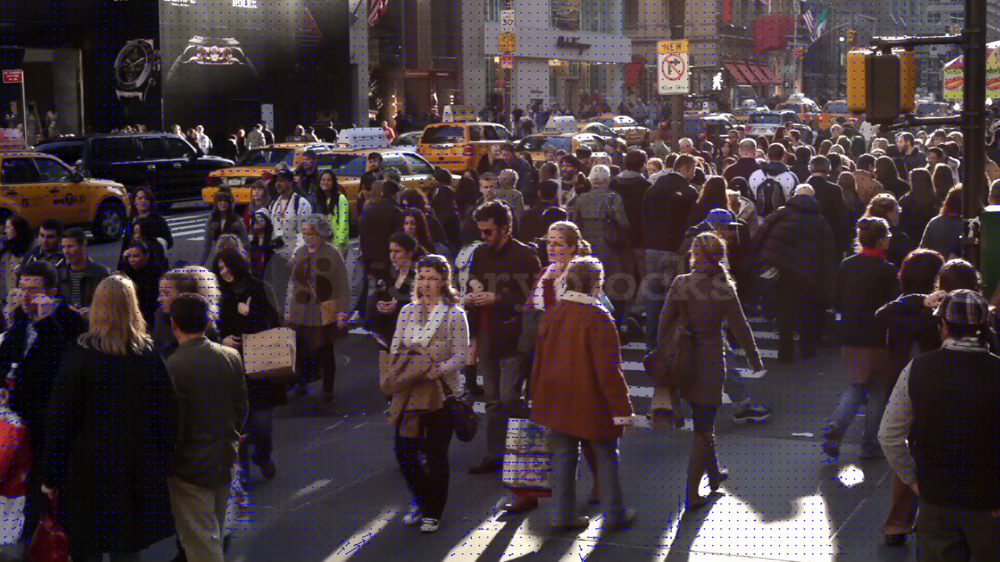


--- Frame 40 Farneback ---


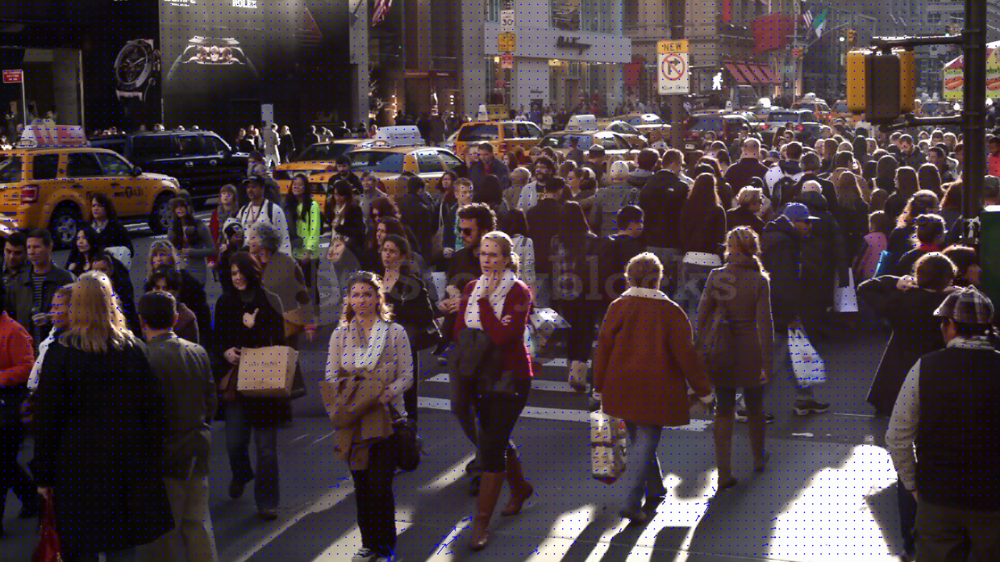


--- Frame 60 Farneback ---


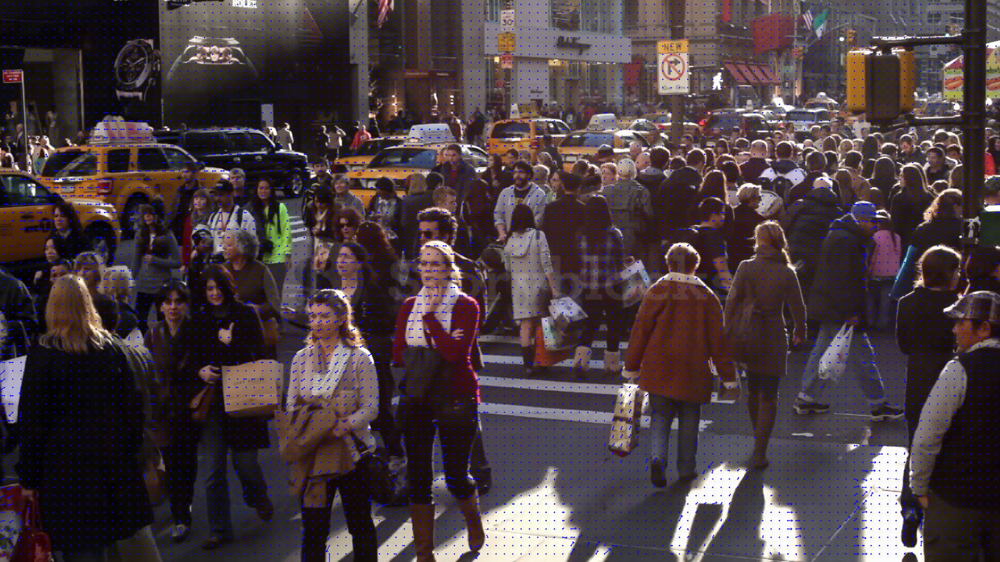


--- Frame 80 Farneback ---


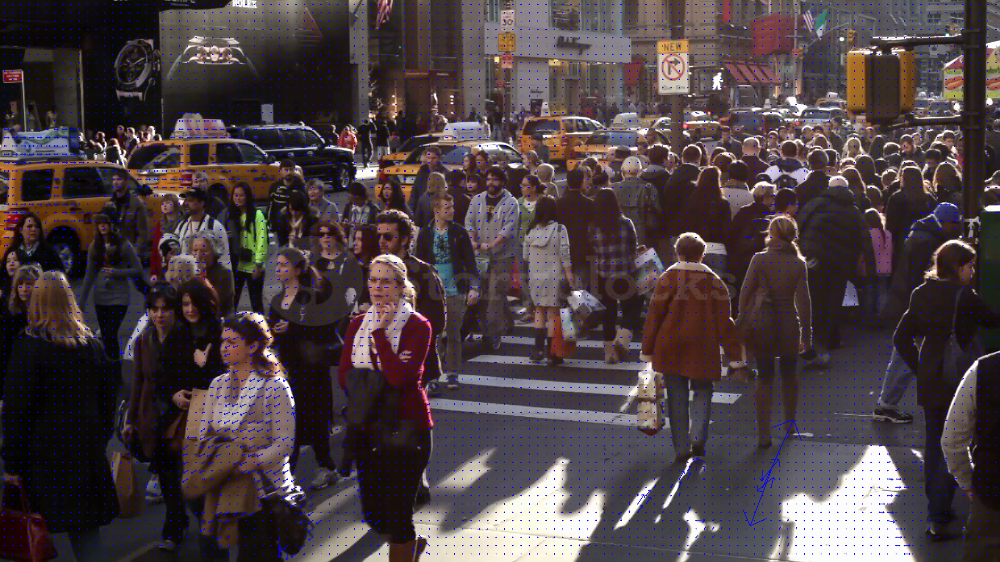

In [9]:
video_path = '/content/drive/MyDrive/DR_AI_응용/data/newyork.mp4'
cap = cv2.VideoCapture(video_path)
MAX_FRAME = 100
CAPTURE_EVERY_FRAME = 20
frame_count = 0

if not cap.isOpened():
  print("can't opend video")
  exit()

while cap.isOpened() and frame_count < MAX_FRAME:
  ret, frame = cap.read()
  if not ret :
    break

  gray = cv2.cvtColor(frame,cv2.COLOR_BGR2GRAY)
  if prev is None:
    prev= gray
  else :
    flow = cv2.calcOpticalFlowFarneback(prev,gray,None,0.7,4,15,3,5,1.1,cv2.OPTFLOW_FARNEBACK_GAUSSIAN)
    drawFlow(frame,flow)
    prev = gray

  if frame_count % CAPTURE_EVERY_FRAME == 0 :
      print(f"\n--- Frame {frame_count} Farneback ---")
      cv2_imshow(frame)
      time.sleep(1)

  frame_count +=1

cap.release()
